In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from clustergram import Clustergram
from sklearn.preprocessing import MinMaxScaler

pd.set_option('display.max_columns', None)

metrics_dict = dict()

In [2]:
df = pd.read_csv("south+german+credit+update/SouthGermanCredit.asc", delimiter=" ")
df

,laufkont,laufzeit,moral,verw,hoehe,sparkont,beszeit,rate,famges,buerge,wohnzeit,verm,alter,weitkred,wohn,bishkred,beruf,pers,telef,gastarb,kredit
0,1,18,4,2,1049,1,2,4,2,1,4,2,21,3,1,1,3,2,1,2,1
1,1,9,4,0,2799,1,3,2,3,1,2,1,36,3,1,2,3,1,1,2,1
2,2,12,2,9,841,2,4,2,2,1,4,1,23,3,1,1,2,2,1,2,1
3,1,12,4,0,2122,1,3,3,3,1,2,1,39,3,1,2,2,1,1,1,1
4,1,12,4,0,2171,1,3,4,3,1,4,2,38,1,2,2,2,2,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1,24,2,3,1987,1,3,2,3,1,4,1,21,3,1,1,2,1,1,2,0
996,1,24,2,0,2303,1,5,4,3,2,1,1,45,3,2,1,3,2,1,2,0
997,4,21,4,0,12680,5,5,4,3,1,4,4,30,3,3,1,4,2,2,2,0
998,2,12,2,3,6468,5,1,2,3,1,1,4,52,3,2,1,4,2,2,2,0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column    Non-Null Count  Dtype
---  ------    --------------  -----
 0   laufkont  1000 non-null   int64
 1   laufzeit  1000 non-null   int64
 2   moral     1000 non-null   int64
 3   verw      1000 non-null   int64
 4   hoehe     1000 non-null   int64
 5   sparkont  1000 non-null   int64
 6   beszeit   1000 non-null   int64
 7   rate      1000 non-null   int64
 8   famges    1000 non-null   int64
 9   buerge    1000 non-null   int64
 10  wohnzeit  1000 non-null   int64
 11  verm      1000 non-null   int64
 12  alter     1000 non-null   int64
 13  weitkred  1000 non-null   int64
 14  wohn      1000 non-null   int64
 15  bishkred  1000 non-null   int64
 16  beruf     1000 non-null   int64
 17  pers      1000 non-null   int64
 18  telef     1000 non-null   int64
 19  gastarb   1000 non-null   int64
 20  kredit    1000 non-null   int64
dtypes: int64(21)
memory usage: 164.2 KB


In [4]:
# згадали що немаємо пропусків у датасеті, також не маємо категоріальних фічей

In [5]:
for col in df.columns:
    df[col] = df[col].astype("int16")

df

,laufkont,laufzeit,moral,verw,hoehe,sparkont,beszeit,rate,famges,buerge,wohnzeit,verm,alter,weitkred,wohn,bishkred,beruf,pers,telef,gastarb,kredit
0,1,18,4,2,1049,1,2,4,2,1,4,2,21,3,1,1,3,2,1,2,1
1,1,9,4,0,2799,1,3,2,3,1,2,1,36,3,1,2,3,1,1,2,1
2,2,12,2,9,841,2,4,2,2,1,4,1,23,3,1,1,2,2,1,2,1
3,1,12,4,0,2122,1,3,3,3,1,2,1,39,3,1,2,2,1,1,1,1
4,1,12,4,0,2171,1,3,4,3,1,4,2,38,1,2,2,2,2,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1,24,2,3,1987,1,3,2,3,1,4,1,21,3,1,1,2,1,1,2,0
996,1,24,2,0,2303,1,5,4,3,2,1,1,45,3,2,1,3,2,1,2,0
997,4,21,4,0,12680,5,5,4,3,1,4,4,30,3,3,1,4,2,2,2,0
998,2,12,2,3,6468,5,1,2,3,1,1,4,52,3,2,1,4,2,2,2,0


In [6]:
 # спочатку побудуємо кластерограму для того щоб візуально оцінити найкращу кількість кластерів для розбиття

In [7]:

scaller = MinMaxScaler()

data_scaled = scaller.fit_transform(df)
data_scaled

array([[0.        , 0.20588235, 1.        , ..., 0.        , 1.        ,
        1.        ],
       [0.        , 0.07352941, 1.        , ..., 0.        , 1.        ,
        1.        ],
       [0.33333333, 0.11764706, 0.5       , ..., 0.        , 1.        ,
        1.        ],
       ...,
       [1.        , 0.25      , 1.        , ..., 1.        , 1.        ,
        0.        ],
       [0.33333333, 0.11764706, 0.5       , ..., 1.        , 1.        ,
        0.        ],
       [0.        , 0.38235294, 0.5       , ..., 0.        , 1.        ,
        0.        ]])

K=1 skipped. Mean computed from data directly.
K=2 fitted in 0.038 seconds.
K=3 fitted in 0.004 seconds.
K=4 fitted in 0.005 seconds.
K=5 fitted in 0.005 seconds.
K=6 fitted in 0.007 seconds.
K=7 fitted in 0.005 seconds.
K=8 fitted in 0.006 seconds.
K=9 fitted in 0.011 seconds.


<Axes: xlabel='Number of clusters (k)', ylabel='PCA weighted mean of the clusters'>

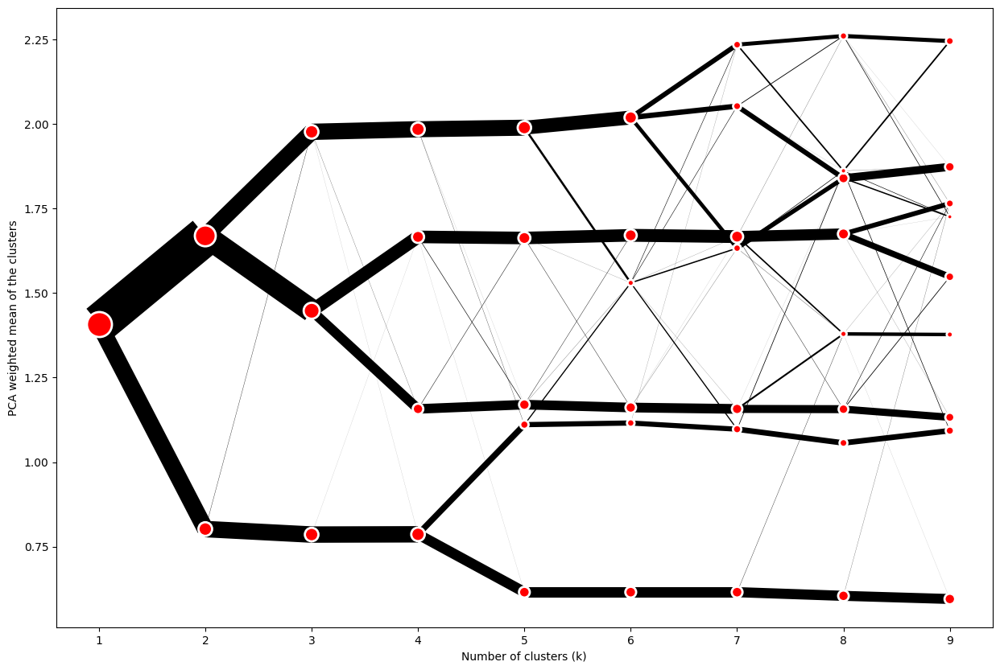

In [8]:
cgram = Clustergram(range(1, 10))
cgram.fit(data_scaled)
cgram.plot(figsize=(15, 10))

In [9]:
# найбільш зрозуміла структура кластерограми на 4 класетрах, також бачимо що з 5 кластерами ми маємо досить непоганий результат.
#  Новий кластер утворився зі часткового перетікання точок з решти кластерів. Тож будемо орієнтуватись, на 4-5 кластерів 

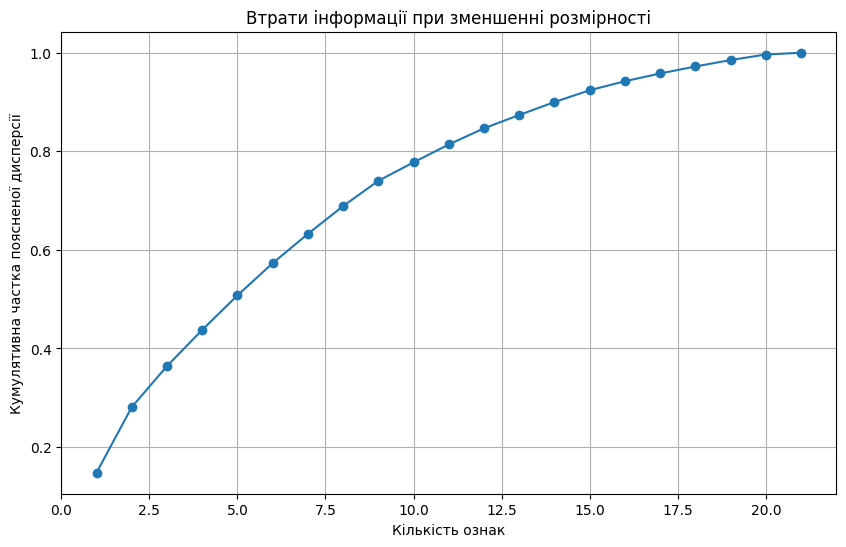

array([0.14791762, 0.28095416, 0.36419636, 0.43764871, 0.50763695,
       0.57299972, 0.63237524, 0.68885345, 0.74009293, 0.77759235,
       0.81385947, 0.84669466, 0.87364746, 0.89990277, 0.92389713,
       0.94218712, 0.95784809, 0.97206055, 0.98512911, 0.99634103,
       1.        ])

In [10]:
# подивимось скільки інформації залишається при різних розмірностях
from sklearn.decomposition import PCA

pca = PCA(random_state=42)
pca.fit(data_scaled)
explained_variance_ratio = pca.explained_variance_ratio_  
cumulative_variance = np.cumsum(explained_variance_ratio)  


plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='-') 
plt.xlabel('Кількість ознак')
plt.ylabel('Кумулятивна частка поясненої дисперсії')
plt.title('Втрати інформації при зменшенні розмірності')
plt.grid()
plt.show()
cumulative_variance

для того щоб відобразити наочно відношення точок до певного кластера у 2д просторі - нам необхідно зменшити розмірність до 2. Тобто залишити всього 2 компоненти (наприклад з PCA). але у такому випадку у нас залишиться вього 28% інформації. Це не дуже багато, а подивитись хочеться. Тож ми проведемо кластерізацію, після чого додамо в наш датафрейм щє одну ознаку - номер кластера і підсвітимо її на TSNE. 

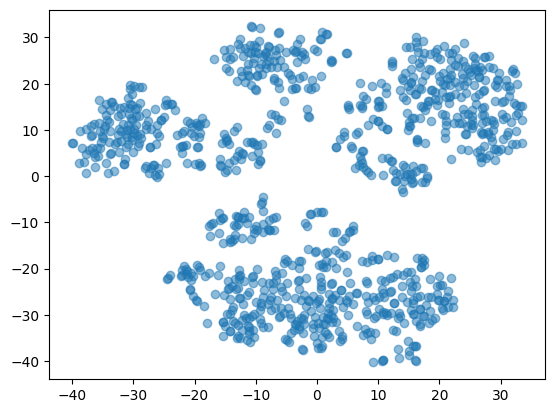

In [11]:
from sklearn.manifold import TSNE

df_scaled = pd.DataFrame(data_scaled, columns=df.columns)

tsne = TSNE(random_state=42)
tsne_repr = tsne.fit_transform(df_scaled)

plt.scatter(tsne_repr[:, 0], tsne_repr[:, 1], alpha=.5)

In [12]:
# цікаво, що тут ми бачимо тіж 4-5 кластерів, які (кількість яких) визначили на етапі будування кластерограми


In [13]:
from sklearn.cluster import KMeans

def train_kmeans(data, num_clusters) -> KMeans:
    kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init="auto")
    kmeans.fit(data)
    return kmeans

In [64]:

from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.metrics.cluster import pair_confusion_matrix

def plot_clasters(data, n_clusters, model_func, cols=2, figsize=None):

    rows = round(n_clusters / cols)

    if not figsize:
        figsize = (cols * 5, rows * 5)
    
    _, axes = plt.subplots(rows, cols, sharey=True, figsize=figsize)
    axes = axes.flatten()

    for i in range(2, n_clusters + 1):
        kmeans = model_func(data, i)
        claster_num = kmeans.labels_

        tsne = TSNE(random_state=42)
        tsne_repr = tsne.fit_transform(df_scaled)
        
        ax = axes[i - 2]
        ax.set_title(f'{i} кластерів')
        ax.scatter(tsne_repr[:, 0], tsne_repr[:, 1], cmap="plasma", c=claster_num, alpha=.5)
    plt.tight_layout()
 

In [75]:
def get_metrics(data, n_clusters, model_func) -> dict:
    data_dict = {
            "ss": [],
            "dbs": [],
            "chs": [],
            "distortions": []
            }
    for i in range(2, n_clusters + 1):

        kmeans = model_func(data, i)

        clasters= kmeans.labels_
        try:
            data_dict["ss"].append(silhouette_score(data, clasters))
            data_dict["dbs"].append(davies_bouldin_score(data, clasters))
            data_dict["chs"].append(calinski_harabasz_score(data, clasters))
            try:
                data_dict["distortions"].append(kmeans.inertia_)
            except AttributeError:
                pass
        except ValueError: # на випадок попадання лише одного кластера
            pass


    return data_dict
        

In [16]:
def plot_metrics(data:dict, figsize=(12, 4)):
    # rows = round(len(data.values()) / cols)

    # if not figsize:
    #     figsize = (cols * 5, rows * 5)
    
    # _, axes = plt.subplots(rows, cols, sharey=True, figsize=figsize)  # так не катить бо діапазони значень завеликі
    # axes = axes.flatten()
    plt.figure(figsize=figsize)
    for i, key in enumerate(data.keys()):
        
        plt.subplot(1, 4, i + 1)
        plt.title(key)
        plt.plot(range(2, len(data[key]) + 2), data[key], marker="o", linestyle="--")
        plt.grid()

    plt.tight_layout()
        

ss :  [np.float64(0.13817478668524677), np.float64(0.13113422820632303), np.float64(0.08806236284022079), np.float64(0.09255652639129074), np.float64(0.11984529578727512), np.float64(0.10262924207913958), np.float64(0.10875019575663618), np.float64(0.10466526751420588), np.float64(0.10579799278726393)]
dbs :  [np.float64(2.4274600115353127), np.float64(2.290636488942323), np.float64(2.5770230578989093), np.float64(2.463515456705828), np.float64(2.2871248075411272), np.float64(2.258187454290224), np.float64(2.4213565623872855), np.float64(2.328492956387723), np.float64(2.239991259347547)]
chs :  [np.float64(136.81622107473058), np.float64(133.02063069595636), np.float64(89.66672923315136), np.float64(80.49521935012808), np.float64(86.48989331945037), np.float64(78.26953896023389), np.float64(72.77334312322398), np.float64(67.3993837499438), np.float64(66.16243561947117)]
distortions :  [1823.3113606606312, 1636.565725510601, 1632.3924601206818, 1566.388346257388, 1444.7271193365107, 140

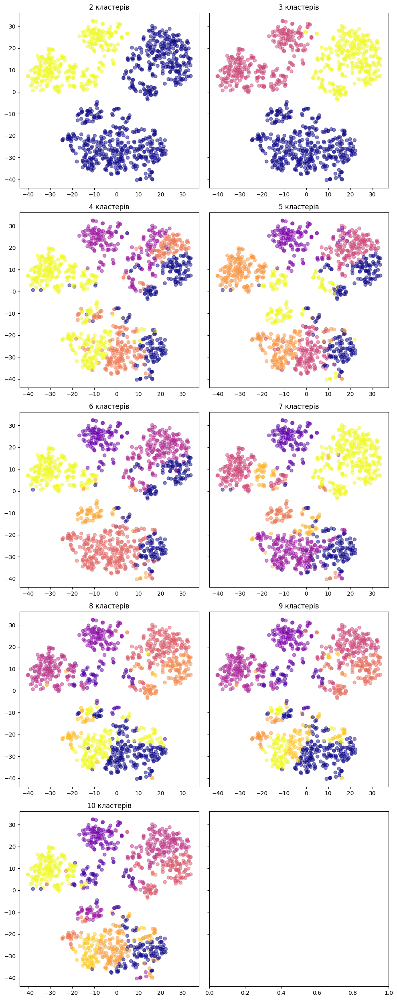

In [17]:
plot_clasters(data_scaled, 10, model_func=train_kmeans)
metrics_dict["all_features_kmeans"] = get_metrics(data_scaled, 10, model_func=train_kmeans)
for val in metrics_dict["all_features_kmeans"]:
    print(val, ": ", metrics_dict["all_features_kmeans"][val])

In [18]:
# на репрезентації моїм очам більше всього зрозуміле розбиття на 3 кластери. 
# варіант з розбиттям на 4 та 5 кластерів не здаються надто привабливими через надтосилььну перемішаність в самих кластерах


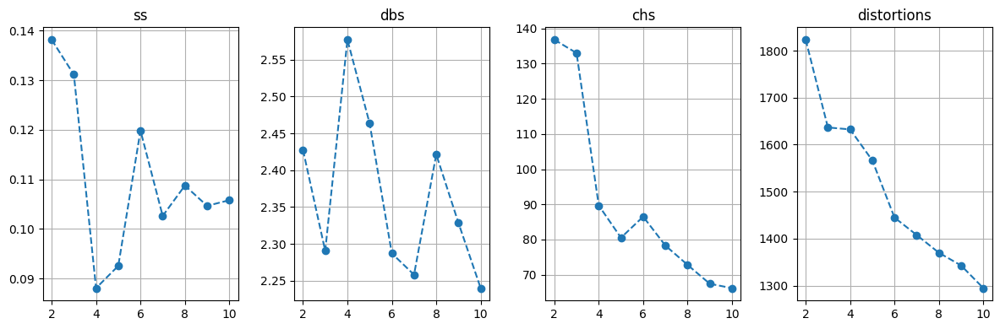

In [19]:
# подивимось що скажуть метрики

data = metrics_dict["all_features_kmeans"]
plot_metrics(data)

На графіках сілуетного коефіцієнта та  chs (співвідношення дисперсії між кластерами до дисперсії всередині них) ми бачимо, що найкращі результати ми отримуємо при розподілі даних на 2-3 кластери.
На графіку distortions (метод ліктя) ми бачимо що інерція значно зменшується на ччетвертому кластері
на графіку dbs (метрика Девіса-Болдуіна, показує, наскільки далеко кластери розміщені відносно свого розміру) найменше значення при розбитті на 3 кластери, далі графік незначно зменшується

Але у всіх цих графіків є дещо спільне: їх показники значно покращуються при розбитті від 2 до 5 (6) кластерів. Думаю, доцільним було б визначитись безпосередньо з тим які самі ознаки ми бажали би відокремити в кластери, після цього вже обирати з варіантів від 2 до 6 як само ми бажаємо розділяти дані 

In [20]:
kmeans = train_kmeans(df_scaled, 4)
labels = kmeans.labels_


In [21]:
df_scaled["labels"] = labels
df_tr = df_scaled.copy()
df_tr.rename(columns={
    'laufkont': 'поточний_рахунок',
    'laufzeit': 'термін',
    'moral': 'кредитоспроможність',
    'verw': 'мета_кредиту',
    'hoehe': 'сума',
    'sparkont': 'ощадний_рахунок',
    'beszeit': 'тривалість_зайнятості',
    'rate': 'щомісячний_платіж',
    'famges': 'сімейний_стан',
    'buerge': 'поручитель',
    'wohnzeit': 'тривалість_проживання',
    'verm': 'майно',
    'alter': 'вік',
    'weitkred': 'інші_кредити',
    'wohn': 'житло',
    'bishkred': 'попередні_кредити',
    'beruf': 'професія',
    'pers': 'кількість_утриманців',
    'telef': 'телефон',
    'gastarb': 'гастарбайтер',
    'kredit': 'кредит'
}, inplace=True)

In [22]:
# не дивлячись на те що у нас достаньо багато дискретних даних припустимо що в наших групах будуть суттєво відрізнятись середні значення
# mean_vals = df.groupby("labels").mean()
def plot_kluster_bars(mean_values):

    # mean_values = df.groupby("labels").mean()


    # Побудуємо накопичувальний бар-графік для середніх значень кожної ознаки по кластерах (осі навпаки)
    plt.figure(figsize=(14, 8))
    mean_values.T.plot(kind='bar', stacked=True, figsize=(15, 10), cmap="viridis", edgecolor='black')

    plt.xlabel('Ознаки')
    plt.ylabel('Середнє значення')
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', linewidth=0.5)
    plt.tight_layout()

    plt.show()

<Figure size 1400x800 with 0 Axes>

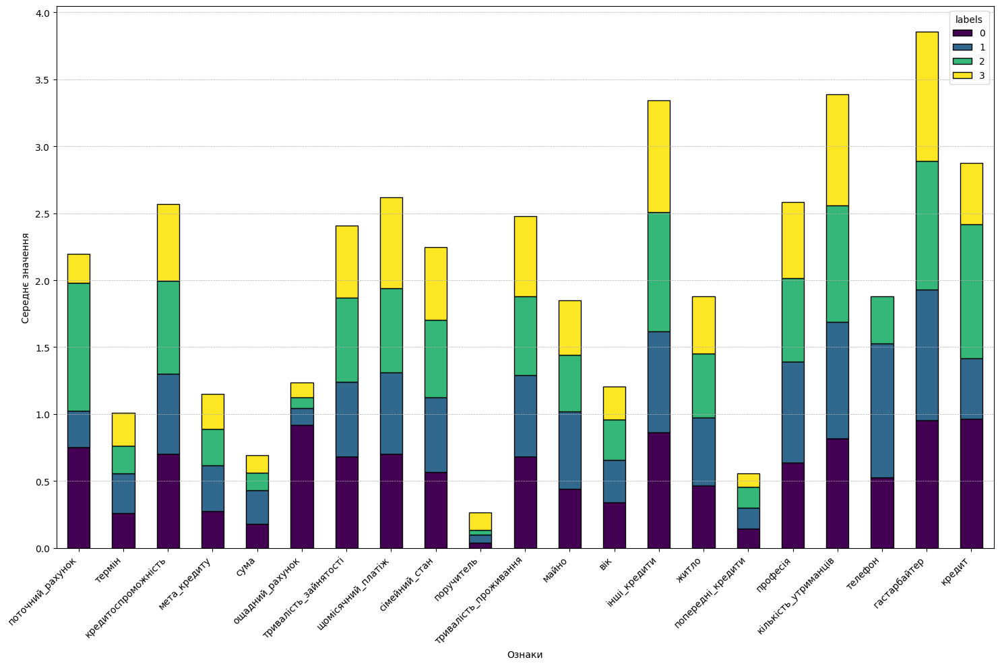

In [23]:
df_tr["labels"] = labels
mean_values = df_tr.groupby("labels").mean()
plot_kluster_bars(mean_values)



In [24]:
mean_values
#  Перше що кидається в очі - це "кредит" - ми бачимо 2 кластери де кредити має значення 1 та 1 кластер де він має значення 0. 
# При розбитті на більшу кількість кластерів ми всеодно отримуємо досить наближене до 1, або 0 значення кредит
# якась цікава історія з ознакою "телефон" - вона або 0 та кредити == 1б або 1 та кредит наближений до 1, а вот проміжне значення стоїть в одній категорії з "кредит" == 0
# кредит == 1 для людей, які мають більше значення "тривалість_зайнятості", "ощадний_рахунок", "кредитоспроможність", "поточний_рахунок" та менший термін

# виглядає досить логічно для середніх значень. Можливо цього було б достаттньо для прийняття рішення про видачу кредиту
# якщо б наш датасет, відображав історію тих хто виплатив та не виплатив кредит - можна було б розбити більш детально на кластери для формування пропозицій щодо кредитування

#UPD: подивився щє раз distortions та розбив на 4 кластери. тепер один з кластерів з "кредит" == 1 має суттєво більший "поточний_рахунок", майже такий самий
#  "термін як при кредит == 2, вищу за всіх кредитоспроможність, ощадний_рахунок, тривалість_зайнятості, щомісячний_платіж, нижчий за всіх "поручитель",
#  нижчий "тривалість_проживання", вищий "інші_кредити" - мабуть якісь юридичні особи вийшли в окрему категорію

,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
0,0.751975,0.261360,0.704976,0.278199,0.178518,0.917062,0.684834,0.703002,0.565561,0.037915,0.680885,0.440758,0.339370,0.862559,0.466825,0.146919,0.639810,0.819905,0.526066,0.952607,0.962085
1,0.274510,0.297938,0.596814,0.340196,0.251838,0.127451,0.557598,0.609477,0.560458,0.061275,0.611111,0.580065,0.317052,0.754902,0.509804,0.155229,0.753268,0.867647,1.000000,0.975490,0.455882
2,0.953519,0.204769,0.692231,0.270916,0.131679,0.080677,0.625498,0.625498,0.577689,0.037849,0.585657,0.422311,0.303500,0.892430,0.474104,0.154050,0.624170,0.868526,0.354582,0.964143,1.000000
3,0.214571,0.243263,0.574850,0.259581,0.132175,0.109281,0.541168,0.682635,0.544910,0.127246,0.597804,0.405190,0.248289,0.830838,0.426647,0.102794,0.566866,0.829341,0.000000,0.961078,0.458084


In [25]:
# одразу подивимось як біи все працювало зі зменшенням розмірності. 
# Пам'ятаємо, що на графіку вищє 30 відсотків інформації ми зберігаємо при зменшенні розмірності до 11 ознак

df_scaled.drop(columns="labels", inplace=True)

In [26]:
pca = PCA(random_state=42, n_components=11)
df_reduced = pca.fit_transform(df_scaled)
df_reduced

array([[-0.36457331, -0.38406775,  0.04090642, ...,  0.04756505,
        -0.23008201, -0.32070989],
       [-0.32995206, -0.66108533, -0.1760175 , ...,  0.24210149,
         0.18822142, -0.1447239 ],
       [-0.14215383, -0.6185361 , -0.05476172, ..., -0.41971762,
        -0.3495401 ,  0.61734508],
       ...,
       [ 0.56665244,  1.03205788,  0.66471912, ...,  0.15171693,
         0.41281876, -0.1698289 ],
       [-0.09519855,  0.84310672, -0.47309938, ...,  0.64804912,
         0.08783542, -0.10770113],
       [-0.52890039,  0.18925174,  0.84326818, ...,  0.13067911,
         0.19937283,  0.2203432 ]])

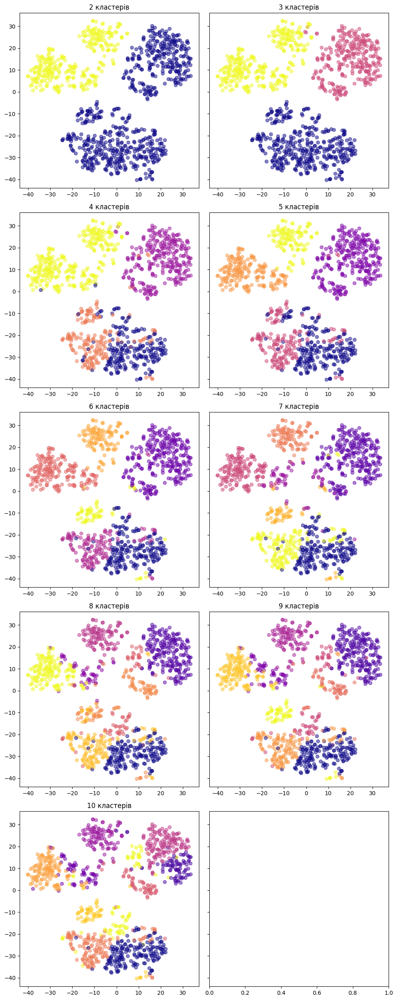

In [27]:
plot_clasters(df_reduced, 10, train_kmeans)

In [28]:
# тут бачимо досить схожу картину, хіба що кластери помінялись кольорами і стали трохи "чистішими"

In [29]:
metrics_dict["reduced_kmeans"] = get_metrics(df_reduced, 10, model_func=train_kmeans)

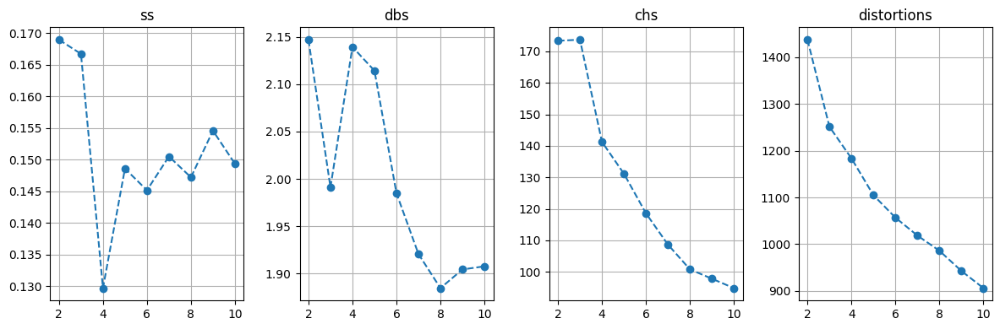

In [30]:
data = metrics_dict["reduced_kmeans"]
plot_metrics(data)

При зменшенні розмірності картина дещо змінилась:
Сілуєт: найкраще значення вираженості сілуета кластерів все щєпри 2 - 3 кластерах. 
Метрика Девіда-Болдуі : найменше значення при розбитті на 8 кластерів. Але воно всього незначно менше ніж при розбитті на 3 кластери, тож поки що варіант з 3 класерами в лідерах
Співвідношення дісперсій між кластерами та внутрі них: бачимо найкращі результати - це 3 та 2
Метод плеча (інерція)Ж після розбиття на 3 кластери інерція вде зменшується значно повілььніше

Висновок: найкращим балансом між кількісю категорій та інформацією, яку вони містять має бути 3 кластери

In [31]:
kmeans = train_kmeans(df_reduced, 3)
labels = kmeans.labels_

In [32]:
df_tr["labels"] = labels  # не нормалізували щоб кращє бачити середні значення тектом
mean_values = df_tr.groupby("labels").mean()
mean_values
# саме прекрасне тут - це те що після зменшення розмірності та наступної кластеризації ми може легко інтерпретувати інформацію просто додавши  мітки кластерів
# до оригінального датафрейма

# при розбитті на 3 кластери ми отримали такий самий результат як і при розбитті повного датафрему на 3 кластери


,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
0,0.601467,0.197720,0.665648,0.270416,0.128223,0.287286,0.602078,0.612062,0.571312,0.094132,0.572942,0.356968,0.283313,0.872861,0.448655,0.132844,0.562347,0.853301,0.000000,0.931540,1.000000
1,0.655405,0.260632,0.693412,0.295608,0.184574,0.381757,0.640203,0.677928,0.578829,0.050676,0.673423,0.512387,0.341699,0.851351,0.494932,0.156532,0.726351,0.834459,1.000000,0.983108,0.983108
2,0.290395,0.306979,0.538136,0.287119,0.200552,0.155085,0.543220,0.700565,0.527684,0.064407,0.614689,0.525424,0.265678,0.774576,0.454237,0.118644,0.642938,0.844068,0.366102,0.986441,0.000000


In [33]:
kmeans = train_kmeans(df_reduced, 4)
labels = kmeans.labels_
df_tr["labels"] = labels  # не нормалізували щоб кращє бачити середні значення тектом
mean_values = df_tr.groupby("labels").mean()
mean_values
# при розбитті на 4 кластери - також отримали глобально такеж саме розбиття за сенсом. Втратили якісь соті відсотки на середніх значеннях, але при цьому модель стала значно легшою

,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
0,0.886463,0.212240,0.697598,0.300000,0.125570,0.421397,0.671397,0.689956,0.572052,0.017467,0.614265,0.446870,0.310667,0.860262,0.484716,0.154294,0.589520,0.908297,0.000000,0.965066,0.986900
1,0.666667,0.262230,0.696735,0.298625,0.185105,0.386598,0.646048,0.686140,0.579611,0.051546,0.678121,0.520046,0.343888,0.852234,0.498282,0.159221,0.731959,0.838488,1.000000,0.982818,0.982818
2,0.244681,0.177800,0.623670,0.230319,0.130938,0.128989,0.513298,0.512411,0.569149,0.188830,0.523050,0.242908,0.249145,0.888298,0.404255,0.102837,0.523050,0.771277,0.026596,0.893617,1.000000
3,0.283105,0.309025,0.535959,0.287329,0.202063,0.147260,0.540240,0.697489,0.527397,0.061644,0.611872,0.525114,0.264861,0.772260,0.452055,0.118721,0.644977,0.849315,0.369863,0.986301,0.000000


<Figure size 1400x800 with 0 Axes>

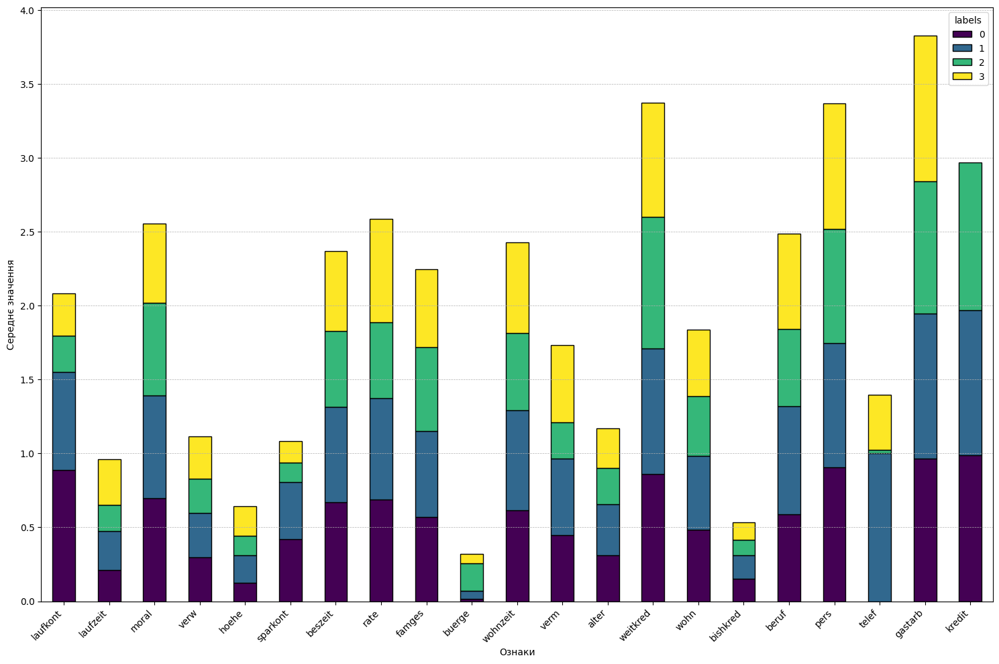

In [34]:
df_scaled["labels"] = labels  # додали в нормалізований дф щоб адекватно відобразити стовбчики
mean_values = df_scaled.groupby("labels").mean()
plot_kluster_bars(mean_values)

Агломеративна модель

In [35]:
from sklearn.cluster import AgglomerativeClustering

In [36]:
df

,laufkont,laufzeit,moral,verw,hoehe,sparkont,beszeit,rate,famges,buerge,wohnzeit,verm,alter,weitkred,wohn,bishkred,beruf,pers,telef,gastarb,kredit
0,1,18,4,2,1049,1,2,4,2,1,4,2,21,3,1,1,3,2,1,2,1
1,1,9,4,0,2799,1,3,2,3,1,2,1,36,3,1,2,3,1,1,2,1
2,2,12,2,9,841,2,4,2,2,1,4,1,23,3,1,1,2,2,1,2,1
3,1,12,4,0,2122,1,3,3,3,1,2,1,39,3,1,2,2,1,1,1,1
4,1,12,4,0,2171,1,3,4,3,1,4,2,38,1,2,2,2,2,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1,24,2,3,1987,1,3,2,3,1,4,1,21,3,1,1,2,1,1,2,0
996,1,24,2,0,2303,1,5,4,3,2,1,1,45,3,2,1,3,2,1,2,0
997,4,21,4,0,12680,5,5,4,3,1,4,4,30,3,3,1,4,2,2,2,0
998,2,12,2,3,6468,5,1,2,3,1,1,4,52,3,2,1,4,2,2,2,0


In [37]:
df_scaled, df_tr = map(lambda x: x.drop(columns="labels"), [df_scaled, df_tr]) # видалимо labels, щоб далі працювати з датафреймами
                                                                                        # це зручно так як наші функції нормально працюють з агломеративною моделлю

In [38]:
def train_aglomerative(data, n_clusters=2):
    model = AgglomerativeClustering(n_clusters=n_clusters)
    model.fit(data)
    return model

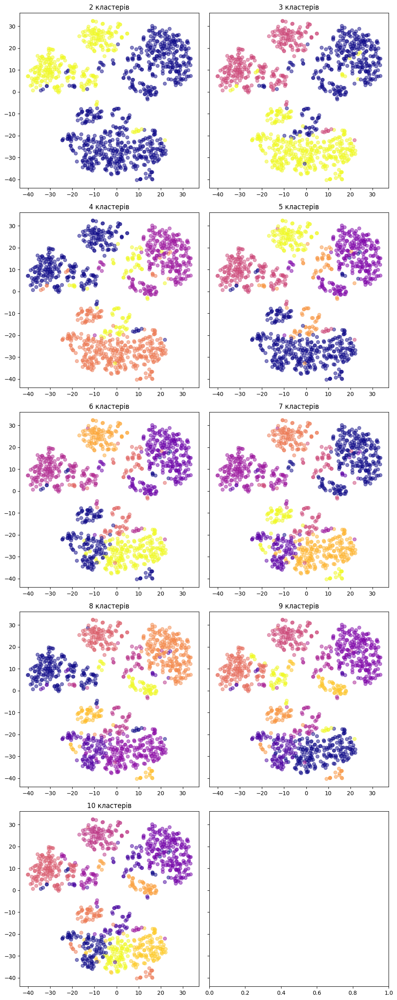

In [39]:
plot_clasters(df_scaled, n_clusters=10, model_func=train_aglomerative)

Візуально, агломеративна модель розбила наші кластери дещо дивно. Якщо прямо придивитись - то може в цьому і є сенс, але трохи засмучує перемішування кластерів

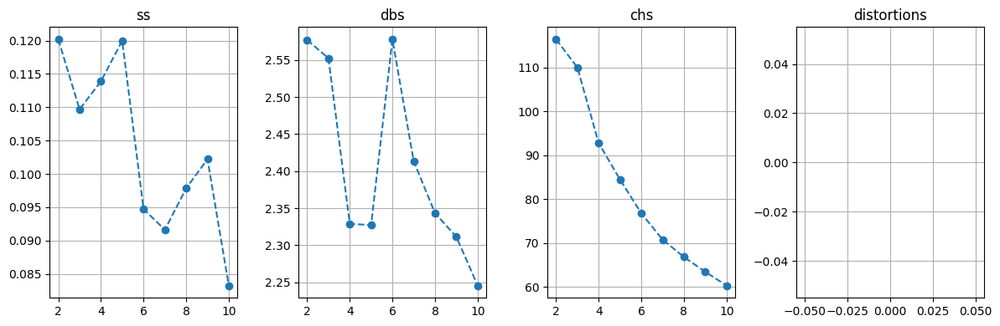

In [40]:
# подивимось що по метрикам
metrics_dict["aglo_all_features"] = get_metrics(df_scaled, 10, model_func=train_aglomerative)
data = metrics_dict["aglo_all_features"]
plot_metrics(data)

Сілует: найкращє виражені сілуети кластерів ми бачимо при розбитті на 2 та на 5. Поовернувшись до репрезентації - можна погодитись
Девіс-Болдуін: найкращі значення маємо при розбитті на 4, 5 та на 9-10 кластерів
дісперсія між кластерами до дісперсії всередині них: найкращі значення 2 та три



In [41]:
aglo = train_aglomerative(df_scaled, 2)
labels = aglo.labels_
df_tr["labels"] = labels  # не нормалізували щоб кращє бачити середні значення тектом
mean_values = df_tr.groupby("labels").mean()
mean_values

,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
0,0.618046,0.224425,0.671459,0.281627,0.153563,0.326087,0.613254,0.639084,0.574568,0.085554,0.610566,0.416082,0.306777,0.847826,0.462833,0.142122,0.630201,0.834502,0.423562,0.952314,0.966339
1,0.296167,0.308567,0.548780,0.285714,0.197734,0.152439,0.553136,0.703833,0.526132,0.040070,0.626016,0.543554,0.267111,0.811847,0.466899,0.119628,0.645761,0.871080,0.355401,0.989547,0.038328


при розбитті на 2 кластери ми бачимо що логіка дещо відрізняється: якщо k-means розбивав умовно керуючись ознакою "кредит", то тут ми бачимо розбиття більш за логікою "надійний - ненадійний". 


In [42]:
aglo = train_aglomerative(df_scaled, 3)
labels = aglo.labels_
df_tr["labels"] = labels  # не нормалізували щоб кращє бачити середні значення тектом
mean_values = df_tr.groupby("labels").mean()
mean_values

,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
0,0.638235,0.262284,0.669853,0.310882,0.188387,0.374265,0.634559,0.671569,0.576471,0.025000,0.650980,0.526471,0.337132,0.741176,0.508824,0.151961,0.707843,0.791176,0.864706,0.985294,0.950000
1,0.296167,0.308567,0.548780,0.285714,0.197734,0.152439,0.553136,0.703833,0.526132,0.040070,0.626016,0.543554,0.267111,0.811847,0.466899,0.119628,0.645761,0.871080,0.355401,0.989547,0.038328
2,0.599643,0.189915,0.672922,0.254960,0.121820,0.282172,0.593834,0.609473,0.572833,0.140751,0.573727,0.315460,0.279108,0.945040,0.420912,0.133155,0.559428,0.873995,0.021448,0.922252,0.981233


продовжуємо відстежувати такуж логіку при розбитті на 3 кластери

In [43]:
aglo = train_aglomerative(df_scaled, 6)
labels = aglo.labels_
df_tr["labels"] = labels  # не нормалізували щоб кращє бачити середні значення тектом
mean_values = df_tr.groupby("labels").mean()
mean_values


,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
0,0.335217,0.168910,0.663842,0.221469,0.116063,0.127119,0.560734,0.576271,0.587571,0.285311,0.563089,0.241055,0.276130,0.915254,0.412429,0.120527,0.529190,0.734463,0.045198,0.836158,0.960452
1,0.669271,0.262868,0.718750,0.276953,0.189081,0.380859,0.644531,0.679688,0.571615,0.017578,0.677083,0.519531,0.339355,0.966797,0.490234,0.153646,0.725260,0.812500,0.996094,0.980469,0.972656
2,0.283422,0.286961,0.546791,0.245455,0.141744,0.140374,0.558824,0.739750,0.520499,0.034759,0.641711,0.515152,0.256875,0.823529,0.457219,0.106952,0.584670,0.807487,0.010695,1.000000,0.058824
3,0.543651,0.260504,0.520833,0.414286,0.186272,0.354167,0.604167,0.646825,0.591270,0.047619,0.571429,0.547619,0.330357,0.053571,0.565476,0.146825,0.654762,0.726190,0.464286,1.000000,0.880952
4,0.320000,0.348971,0.552500,0.361000,0.302435,0.175000,0.542500,0.636667,0.536667,0.050000,0.596667,0.596667,0.286250,0.790000,0.485000,0.143333,0.760000,0.990000,1.000000,0.970000,0.000000
5,0.838435,0.208884,0.681122,0.285204,0.127020,0.422194,0.623724,0.639456,0.559524,0.010204,0.583333,0.382653,0.281797,0.971939,0.428571,0.144558,0.586735,1.000000,0.000000,1.000000,1.000000


In [44]:
counts = df_tr["labels"].value_counts()
counts  # не схоже, що це викиди - групи досить великі. Звернемо увагу на групи 4 та 5 - вони значно менші за решту, мабуть є якимось спецефічними 
# 5 кластер має кредит == 0, має аномально велику суму, має не самий малий ощадний рахунок, але на відміну від решти - цей рахунок менший (значно менший) 
# ніж сума кредиту, має велике значення "кількість утриманців" і всі значення "телефон" == 1 (я так розумію з телефона намагались оформити)

# четверта група - нижчий термін, нижча сума, значно вищий ощадний рахунок за суму, найменший показник інші_кредити та найвищій житло

# нажаль немає стілььки світла щоб дослідити кожну групу, але розбиття на 3 кластерии дає розуміння надійності клієнта. 
# Розбиття на 6 кластерів виглядає так наче розширює це розуміння в залежності від фінансового становища та додаткових умов в яких знаходиться клієнт

labels
1    256
5    196
2    187
0    177
4    100
3     84
Name: count, dtype: int64

<Figure size 1400x800 with 0 Axes>

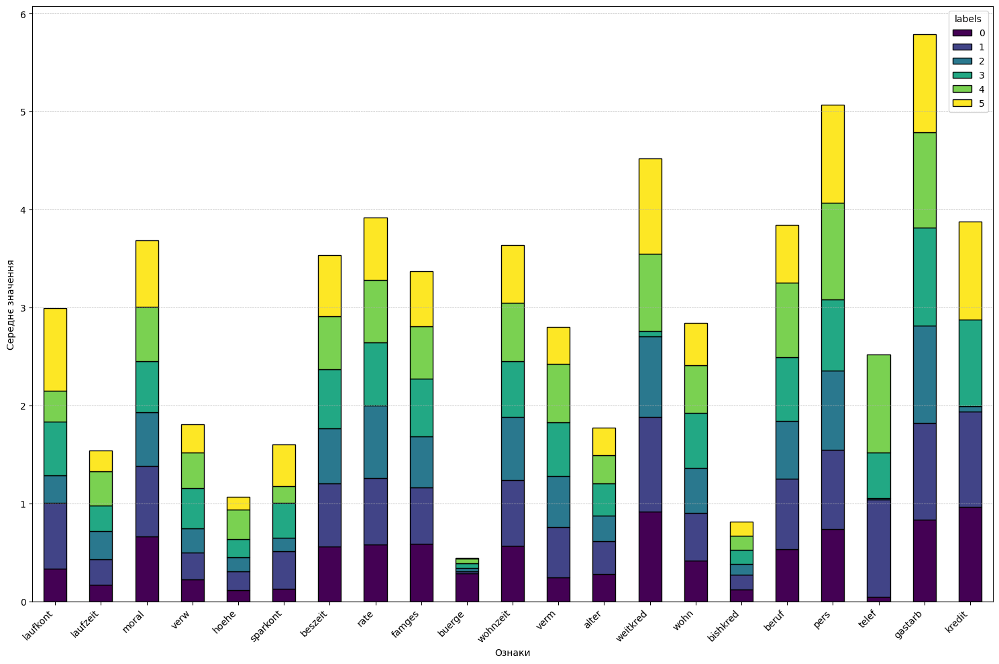

In [45]:
df_scaled["labels"] = labels  # не нормалізували щоб кращє бачити середні значення тектом
mean_values = df_scaled.groupby("labels").mean()
mean_values
plot_kluster_bars(mean_values)

In [46]:
df_scaled

,laufkont,laufzeit,moral,verw,hoehe,sparkont,beszeit,rate,famges,buerge,wohnzeit,verm,alter,weitkred,wohn,bishkred,beruf,pers,telef,gastarb,kredit,labels
0,0.000000,0.205882,1.0,0.2,0.043964,0.00,0.25,1.000000,0.333333,0.0,1.000000,0.333333,0.035714,1.0,0.0,0.000000,0.666667,1.0,0.0,1.0,1.0,0
1,0.000000,0.073529,1.0,0.0,0.140255,0.00,0.50,0.333333,0.666667,0.0,0.333333,0.000000,0.303571,1.0,0.0,0.333333,0.666667,0.0,0.0,1.0,1.0,0
2,0.333333,0.117647,0.5,0.9,0.032519,0.25,0.75,0.333333,0.333333,0.0,1.000000,0.000000,0.071429,1.0,0.0,0.000000,0.333333,1.0,0.0,1.0,1.0,5
3,0.000000,0.117647,1.0,0.0,0.103004,0.00,0.50,0.666667,0.666667,0.0,0.333333,0.000000,0.357143,1.0,0.0,0.333333,0.333333,0.0,0.0,0.0,1.0,0
4,0.000000,0.117647,1.0,0.0,0.105700,0.00,0.50,1.000000,0.666667,0.0,1.000000,0.333333,0.339286,0.0,0.5,0.333333,0.333333,1.0,0.0,0.0,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.000000,0.294118,0.5,0.3,0.095576,0.00,0.50,0.333333,0.666667,0.0,1.000000,0.000000,0.035714,1.0,0.0,0.000000,0.333333,0.0,0.0,1.0,0.0,2
996,0.000000,0.294118,0.5,0.0,0.112964,0.00,1.00,1.000000,0.666667,0.5,0.000000,0.000000,0.464286,1.0,0.5,0.000000,0.666667,1.0,0.0,1.0,0.0,2
997,1.000000,0.250000,1.0,0.0,0.683944,1.00,1.00,1.000000,0.666667,0.0,1.000000,1.000000,0.196429,1.0,1.0,0.000000,1.000000,1.0,1.0,1.0,0.0,4
998,0.333333,0.117647,0.5,0.3,0.342137,1.00,0.00,0.333333,0.666667,0.0,0.000000,1.000000,0.589286,1.0,0.5,0.000000,1.000000,1.0,1.0,1.0,0.0,4


In [47]:
# подивимось що буде якщо зменшити розмірність до 11 ознак
df_scaled.drop(columns="labels", inplace=True)
pca = PCA(n_components=11, random_state=42)
df_reduced = pca.fit_transform(df_scaled)

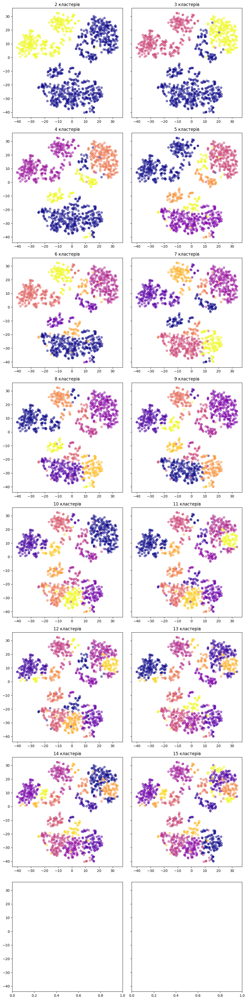

In [48]:
plot_clasters(df_reduced, 15, train_aglomerative)

бачимо, що репрезентація значно змінилась, групи стали більш відокремленими одна від одної. Розбиття на 6 та на 8-9 кластерів виглядають цілком зрозумілими і цікавими

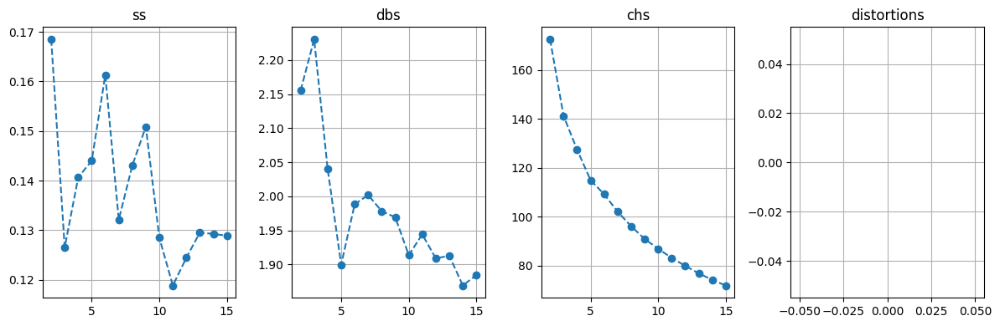

In [49]:
metrics_dict["aglo_reduced"] = get_metrics(df_reduced, 15, train_aglomerative)
data = metrics_dict["aglo_reduced"]
plot_metrics(data)

Сілует: бачимо найкращі показники при розбитті на 2 та 6 груп
Девіс-Болдуін: найкращій варіант - 2 кластери
Дісперсія між кластерами до дисперсії в кластерах: також каже нам про те що найкращій варіант - це 2-3 кластери

Судячи з метрик ми можемо сказати що при розбитті на 2-3 кластери ми отримаємо чітко відокремлені групи. Варіант розбиття на 6 кластерів можливий, але відношення точок буде всже не таким однозначним. Скоріше деякі кластери стануть підгрупами більших


In [50]:
aglo_reduced = train_aglomerative(df_reduced, 2)
labels = aglo_reduced.labels_
df_tr["labels"] = labels  # не нормалізували щоб кращє бачити середні значення тектом
mean_values = df_tr.groupby("labels").mean()
mean_values


,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
0,0.622318,0.22366,0.676323,0.279542,0.150608,0.322961,0.618383,0.639962,0.574630,0.075107,0.613734,0.420601,0.307199,0.864092,0.467811,0.141154,0.630424,0.844063,0.414878,0.952790,1.000000
1,0.301218,0.30643,0.543189,0.290365,0.202542,0.167774,0.544020,0.698782,0.528239,0.066445,0.617940,0.527132,0.267976,0.775748,0.455150,0.122924,0.644518,0.847176,0.378738,0.986711,0.003322


При розбитті на 2 кластери вцілому бачимо просту картину: ті хто має кредит == 1 та кредит наближений до 0

In [54]:
aglo_reduced = train_aglomerative(df_reduced, 5)
labels = aglo_reduced.labels_
df_tr["labels"] = labels 
mean_values = df_tr.groupby("labels").mean()
mean_values

,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
0,0.301218,0.306430,0.543189,0.290365,0.202542,0.167774,0.544020,0.698782,0.528239,0.066445,0.617940,0.527132,0.267976,0.775748,0.455150,0.122924,0.644518,0.847176,0.378738,0.986711,0.003322
1,0.612554,0.202683,0.668831,0.275325,0.126126,0.296266,0.602273,0.652597,0.561688,0.077922,0.593074,0.371212,0.273133,0.988636,0.443182,0.123377,0.584416,0.993506,0.000000,0.954545,1.000000
2,0.693396,0.251665,0.716981,0.264623,0.171288,0.356132,0.639151,0.685535,0.556604,0.044811,0.665094,0.492138,0.339960,0.981132,0.471698,0.138365,0.723270,0.995283,1.000000,0.981132,1.000000
3,0.596825,0.216807,0.702381,0.245714,0.174268,0.345238,0.661905,0.520635,0.628571,0.114286,0.625397,0.374603,0.346769,0.823810,0.485714,0.203175,0.587302,0.000000,0.447619,0.895238,1.000000
4,0.495495,0.240461,0.554054,0.387838,0.159686,0.307432,0.564189,0.626126,0.603604,0.094595,0.536036,0.486486,0.298986,0.067568,0.533784,0.135135,0.617117,0.986486,0.418919,0.945946,1.000000


при розбитті на 5 кластерів маємо глобально тих хто має кредит наближено до 0, і 5 підгрупи які мають кредит == 1 (деякі ознаки схожі, деякі відрізняються). По факту маємо досить непогане розбиття на підгрупи. Корисно для розуміння аудіторії

HDBSCAN

In [69]:
from sklearn.cluster import HDBSCAN

def train_hdbscan(data, min_cluster_size):
    hdb = HDBSCAN(min_cluster_size=min_cluster_size)
    hdb.fit(data)
    return hdb

In [62]:
try:
    df_scaled.drop(columns="labels", inplace=True)
except KeyError:
    pass

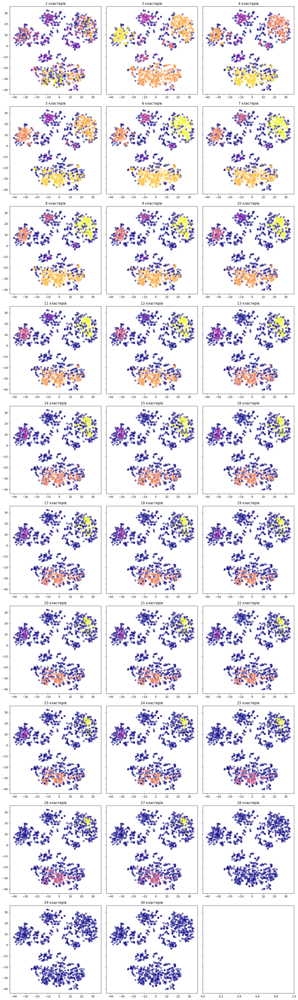

In [72]:
plot_clasters(df_scaled, 30, train_hdbscan, cols=3) # в даному випадку 30 - це максимальне значення мінімального розміру кластера

бачимо дуже сильне перемішування кластерів, подивимось що нам скажуть метрики

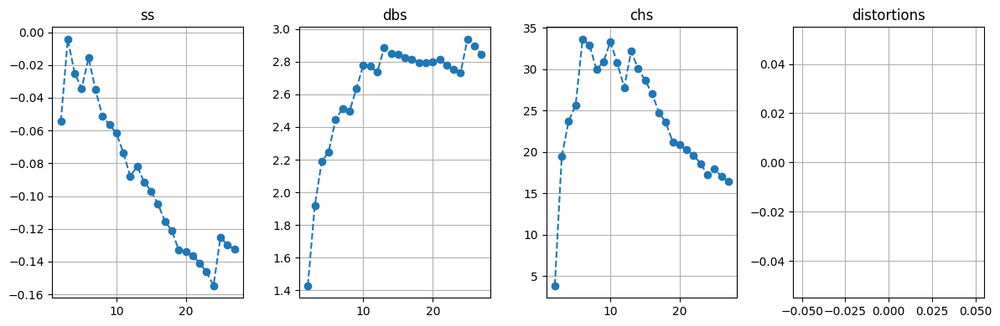

In [76]:
metrics_dict["dbs"] = get_metrics(df_scaled, 30, train_hdbscan)
data = metrics_dict["dbs"]
plot_metrics(data)

Сілует: єдинні 2 варіанти розбиття які можна вважати нормальними - це радіуси 3 та 6
Девіс-Боудуін: найкращий варіант розбиття з радіусом 2
відношення дісперсій: радіуси 6 та 10 

In [78]:
dbs = train_hdbscan(df_scaled, 2)
labels = dbs.labels_
df_tr["labels"] = labels 
mean_values = df_tr.groupby("labels").mean()
mean_values

,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
-1,0.528436,0.263591,0.641588,0.312322,0.184557,0.280213,0.576422,0.613744,0.545814,0.095972,0.603476,0.473934,0.311104,0.81872,0.457346,0.153239,0.626382,0.862559,0.417062,0.954976,0.680095
0,0.666667,0.139706,0.250000,0.050000,0.305024,0.000000,1.000000,0.333333,0.500000,0.000000,1.000000,1.000000,0.669643,0.00000,0.750000,0.166667,1.000000,0.000000,1.000000,1.000000,0.000000
1,0.500000,0.205882,0.562500,0.375000,0.068835,0.812500,0.437500,1.000000,0.583333,0.000000,0.333333,0.166667,0.294643,0.00000,0.375000,0.166667,0.416667,0.000000,0.000000,1.000000,0.000000
2,1.000000,0.161765,0.500000,0.400000,0.118714,0.000000,1.000000,1.000000,0.666667,0.000000,1.000000,0.333333,0.500000,0.00000,0.500000,0.666667,0.666667,0.000000,1.000000,1.000000,1.000000
3,0.500000,0.250000,0.500000,0.150000,0.112661,0.125000,0.875000,0.333333,0.666667,0.000000,1.000000,1.000000,0.383929,0.00000,1.000000,0.000000,0.833333,0.000000,1.000000,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,1.000000,0.205882,0.500000,0.200000,0.055189,0.000000,0.437500,1.000000,0.916667,0.000000,0.333333,0.083333,0.258929,1.00000,0.500000,0.000000,0.666667,1.000000,0.000000,1.000000,1.000000
196,0.833333,0.161765,0.500000,0.150000,0.079262,0.000000,0.250000,1.000000,0.666667,0.000000,0.000000,0.000000,0.187500,1.00000,0.500000,0.000000,0.666667,1.000000,0.000000,1.000000,1.000000
197,1.000000,0.088235,0.583333,0.300000,0.039544,0.000000,0.416667,0.666667,0.333333,0.000000,0.111111,0.000000,0.130952,1.00000,0.500000,0.000000,0.666667,1.000000,0.000000,1.000000,1.000000


In [80]:
counts = df_tr.groupby("labels").count()
counts # майже все шум

,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
-1,422,422,422,422,422,422,422,422,422,422,422,422,422,422,422,422,422,422,422,422,422
0,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
1,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
3,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
196,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
197,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3


In [81]:
dbs = train_hdbscan(df_scaled, 3)
labels = dbs.labels_
df_tr["labels"] = labels 
mean_values = df_tr.groupby("labels").mean()
mean_values

,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
-1,0.449755,0.282115,0.612132,0.381985,0.218708,0.340993,0.590074,0.563725,0.560049,0.139706,0.686275,0.515931,0.342700,0.613971,0.507353,0.188725,0.632353,0.724265,0.511029,0.908088,0.566176
0,0.500000,0.205882,0.562500,0.375000,0.068835,0.812500,0.437500,1.000000,0.583333,0.000000,0.333333,0.166667,0.294643,0.000000,0.375000,0.166667,0.416667,0.000000,0.000000,1.000000,0.000000
1,0.000000,0.441176,0.416667,0.633333,0.178992,1.000000,0.916667,1.000000,0.555556,0.000000,0.777778,0.777778,0.315476,0.833333,0.500000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000
2,0.111111,0.441176,0.416667,0.300000,0.515021,0.000000,0.250000,0.111111,0.111111,0.000000,0.111111,0.666667,0.345238,0.000000,0.500000,0.000000,0.555556,1.000000,1.000000,1.000000,0.000000
3,0.714286,0.243697,0.464286,0.185714,0.097101,0.321429,0.928571,0.952381,0.666667,0.000000,0.904762,0.809524,0.331633,0.000000,0.714286,0.095238,0.476190,0.000000,0.000000,1.000000,0.428571
4,0.000000,0.078431,1.000000,0.000000,0.091229,0.000000,0.333333,0.333333,0.666667,0.000000,0.666667,0.000000,0.416667,1.000000,0.166667,0.222222,0.333333,0.000000,0.000000,0.000000,1.000000
5,1.000000,0.073529,1.000000,0.400000,0.142823,1.000000,0.416667,0.111111,0.666667,0.000000,0.222222,0.111111,0.279762,1.000000,0.500000,0.333333,0.444444,0.000000,0.000000,1.000000,1.000000
6,0.297619,0.333508,0.575893,0.300000,0.262739,0.022321,0.500000,0.773810,0.529762,0.035714,0.571429,0.642857,0.241071,0.955357,0.473214,0.101190,0.761905,1.000000,1.000000,1.000000,0.000000
7,0.083333,0.352941,0.395833,0.166667,0.179130,0.000000,0.666667,0.750000,0.666667,0.000000,0.666667,0.583333,0.318452,1.000000,0.541667,0.111111,0.555556,0.000000,0.000000,1.000000,0.000000


In [82]:
counts = df_tr.groupby("labels").count()
counts # вже кращє, але чверть датафрейму знов позначено як шум

,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
-1,272,272,272,272,272,272,272,272,272,272,272,272,272,272,272,272,272,272,272,272,272
0,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
1,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3
2,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3
3,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7
4,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3
5,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3
6,56,56,56,56,56,56,56,56,56,56,56,56,56,56,56,56,56,56,56,56,56
7,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12


In [83]:
dbs = train_hdbscan(df_scaled, 6)
labels = dbs.labels_
df_tr["labels"] = labels 
mean_values = df_tr.groupby("labels").mean()
mean_values

,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
-1,0.453788,0.268817,0.611932,0.336818,0.202875,0.323864,0.585227,0.575758,0.560606,0.119318,0.656818,0.493182,0.341640,0.682955,0.495455,0.165152,0.622727,0.718182,0.477273,0.915909,0.625
0,0.456140,0.087461,0.776316,0.163158,0.120681,0.039474,0.592105,0.280702,0.649123,0.157895,0.350877,0.070175,0.366541,1.000000,0.394737,0.210526,0.491228,0.000000,0.000000,1.000000,1.000
1,0.944444,0.382353,0.729167,0.208333,0.206348,0.833333,0.770833,0.833333,0.638889,0.000000,0.666667,0.638889,0.342262,0.916667,0.541667,0.166667,0.750000,0.000000,1.000000,1.000000,1.000
2,0.240310,0.317715,0.569767,0.241860,0.220553,0.023256,0.517442,0.813953,0.511628,0.011628,0.565891,0.612403,0.224252,0.988372,0.476744,0.085271,0.744186,1.000000,1.000000,1.000000,0.000
3,0.083333,0.227941,0.312500,0.150000,0.079255,0.031250,0.531250,0.958333,0.541667,0.000000,0.791667,0.458333,0.207589,0.000000,0.437500,0.083333,0.541667,1.000000,0.000000,1.000000,0.000
4,0.226190,0.259629,0.535714,0.220238,0.118582,0.133929,0.470238,0.785714,0.507937,0.023810,0.555556,0.384921,0.190264,0.988095,0.392857,0.059524,0.615079,1.000000,0.000000,1.000000,0.000
5,0.644444,0.199366,0.678431,0.258824,0.118439,0.250980,0.609804,0.691503,0.563399,0.052941,0.576471,0.358170,0.247409,0.960784,0.433333,0.122876,0.598693,1.000000,0.000000,1.000000,1.000
6,0.803357,0.258358,0.708633,0.236691,0.157735,0.334532,0.694245,0.748201,0.585132,0.007194,0.625899,0.525180,0.313849,0.982014,0.464029,0.117506,0.731415,1.000000,1.000000,1.000000,1.000


In [84]:
counts = df_tr.groupby("labels").count()
counts # вже кращє, але чверть датафрейму знов позначено як шум

,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
-1,440,440,440,440,440,440,440,440,440,440,440,440,440,440,440,440,440,440,440,440,440
0,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19
1,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12
2,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43
3,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8
4,84,84,84,84,84,84,84,84,84,84,84,84,84,84,84,84,84,84,84,84,84
5,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255
6,139,139,139,139,139,139,139,139,139,139,139,139,139,139,139,139,139,139,139,139,139


In [ ]:
# ми бачимо певне розбиття, досить чітко, особливо по діскретним фічам, але така кількість шуму просто вирізає від 25 до 50% даних.
# це очікувана поведінка, так як для hdbscan потрібен досить спецефічний датасет

In [86]:
try:
    df_scaled.drop(columns="labels", inplace=True)
except KeyError:
    pass

pca = PCA(n_components=11, random_state=42)
df_reduced = pca.fit_transform(df_scaled)

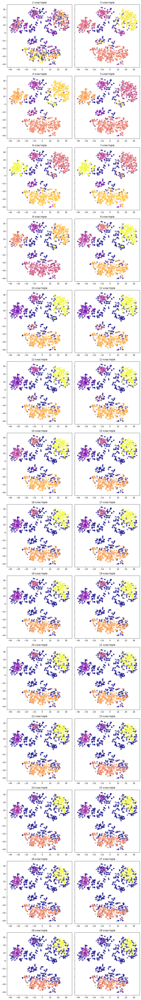

In [87]:
plot_clasters(df_reduced, 29, train_hdbscan)

загальна картина стала значно кращою

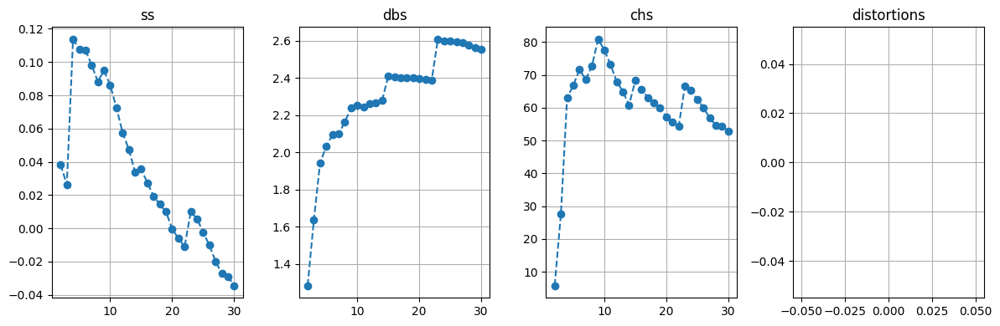

In [88]:
metrics_dict["dbs_reduced"] = get_metrics(df_reduced, 30, train_hdbscan)
data = metrics_dict["dbs_reduced"]
plot_metrics(data)

перше що хочеться відмітити - самі значення метрик стали глобально більш якісними
Сілует пропонує нам робити радіус == 4,
dbs - 2
chs - 9

In [89]:
dbs_reduced = train_hdbscan(df_reduced, 2)
labels = dbs_reduced.labels_
df_tr["labels"] = labels 
mean_values = df_tr.groupby("labels").mean()
mean_values

,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
-1,0.562358,0.255502,0.659864,0.314286,0.171563,0.275510,0.573980,0.623583,0.544218,0.073129,0.592971,0.444444,0.300717,0.812925,0.472789,0.154195,0.629252,0.857143,0.397959,0.955782,0.721088
0,0.500000,0.205882,0.562500,0.375000,0.068835,0.812500,0.437500,1.000000,0.583333,0.000000,0.333333,0.166667,0.294643,0.000000,0.375000,0.166667,0.416667,0.000000,0.000000,1.000000,0.000000
1,0.666667,0.294118,0.500000,0.100000,0.395648,1.000000,0.500000,0.666667,0.666667,0.500000,1.000000,0.166667,0.339286,0.000000,0.000000,0.333333,0.833333,0.000000,1.000000,1.000000,1.000000
2,0.333333,0.367647,0.666667,0.833333,0.508327,0.083333,0.500000,0.444444,0.666667,0.166667,0.666667,0.777778,0.386905,1.000000,0.666667,0.111111,0.777778,0.000000,1.000000,1.000000,0.000000
3,1.000000,0.117647,0.500000,0.366667,0.099244,0.083333,1.000000,0.777778,0.666667,0.000000,1.000000,0.555556,0.470238,0.000000,0.666667,0.444444,0.666667,0.000000,1.000000,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
244,0.000000,0.205882,0.500000,0.200000,0.069770,0.000000,0.375000,1.000000,0.666667,0.750000,0.000000,0.333333,0.062500,1.000000,0.500000,0.000000,0.333333,1.000000,0.000000,0.500000,1.000000
245,1.000000,0.073529,0.625000,0.250000,0.060609,0.000000,0.500000,0.666667,0.500000,0.000000,0.333333,0.000000,0.089286,1.000000,0.250000,0.000000,0.500000,1.000000,0.000000,1.000000,1.000000
246,1.000000,0.161765,0.500000,0.185714,0.057877,0.035714,0.464286,1.000000,0.619048,0.071429,0.333333,0.047619,0.265306,1.000000,0.428571,0.000000,0.619048,1.000000,0.000000,1.000000,1.000000


248 кластерів - явний перебір

In [90]:
dbs_reduced = train_hdbscan(df_reduced, 3)
labels = dbs_reduced.labels_
df_tr["labels"] = labels 
mean_values = df_tr.groupby("labels").mean()
mean_values

,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
-1,0.496644,0.282077,0.580537,0.365101,0.212916,0.343960,0.644295,0.597315,0.592841,0.093960,0.646532,0.501119,0.363974,0.510067,0.580537,0.161074,0.626398,0.516779,0.503356,0.953020,0.604027
0,0.500000,0.205882,0.562500,0.375000,0.068835,0.812500,0.437500,1.000000,0.583333,0.000000,0.333333,0.166667,0.294643,0.000000,0.375000,0.166667,0.416667,0.000000,0.000000,1.000000,0.000000
1,1.000000,0.250000,0.437500,0.250000,0.149348,0.687500,1.000000,0.750000,0.666667,0.000000,0.916667,0.666667,0.357143,0.000000,0.625000,0.083333,0.500000,0.000000,0.000000,1.000000,1.000000
2,0.466667,0.135294,0.500000,0.220000,0.329724,1.000000,0.350000,0.133333,0.600000,0.000000,0.133333,0.466667,0.264286,1.000000,0.500000,0.066667,0.600000,1.000000,1.000000,1.000000,0.000000
3,0.266667,0.241176,0.450000,0.100000,0.080918,0.050000,0.750000,0.933333,0.666667,0.000000,0.933333,0.933333,0.275000,0.000000,0.600000,0.200000,0.533333,0.000000,0.000000,1.000000,0.000000
4,0.000000,0.488235,0.450000,0.160000,0.225212,0.000000,0.550000,0.666667,0.600000,0.000000,1.000000,1.000000,0.485714,1.000000,1.000000,0.333333,0.533333,0.000000,0.000000,1.000000,0.000000
5,0.083333,0.227941,0.375000,0.275000,0.067156,0.000000,0.875000,1.000000,0.666667,0.000000,0.666667,0.666667,0.339286,1.000000,0.250000,0.083333,0.583333,0.000000,0.000000,1.000000,0.000000
6,0.000000,0.441176,0.416667,0.633333,0.178992,1.000000,0.916667,1.000000,0.555556,0.000000,0.777778,0.777778,0.315476,0.833333,0.500000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000
7,0.916667,0.055147,0.875000,0.300000,0.124230,1.000000,0.375000,0.083333,0.666667,0.000000,0.250000,0.083333,0.254464,1.000000,0.500000,0.250000,0.416667,0.000000,0.000000,0.750000,1.000000


In [91]:
counts = df_tr.groupby("labels").count()
counts # вже кращє, шуму меньше, але багато категорій - це скоріш оверлаєри

,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
-1,149,149,149,149,149,149,149,149,149,149,149,149,149,149,149,149,149,149,149,149,149
0,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
1,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
2,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5
3,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5
4,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5
5,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
6,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3
7,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4


In [92]:
dbs_reduced = train_hdbscan(df_reduced, 9)
labels = dbs_reduced.labels_
df_tr["labels"] = labels 
mean_values = df_tr.groupby("labels").mean()
mean_values

,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
-1,0.456702,0.287942,0.583630,0.351246,0.218686,0.366548,0.620107,0.594306,0.587189,0.081851,0.647687,0.521945,0.339794,0.542705,0.539146,0.163701,0.639383,0.580071,0.530249,0.950178,0.58363
0,0.436782,0.110548,0.750000,0.120690,0.121566,0.068966,0.551724,0.275862,0.655172,0.206897,0.379310,0.080460,0.362685,1.000000,0.379310,0.183908,0.459770,0.000000,0.000000,0.758621,1.00000
1,0.239583,0.274931,0.533203,0.237500,0.125708,0.126953,0.488281,0.757812,0.497396,0.078125,0.588542,0.429688,0.208566,0.875000,0.371094,0.091146,0.591146,1.000000,0.000000,1.000000,0.00000
2,0.266667,0.330749,0.586364,0.270909,0.264550,0.022727,0.495455,0.757576,0.521212,0.036364,0.563636,0.618182,0.235390,0.972727,0.454545,0.090909,0.769697,1.000000,1.000000,0.981818,0.00000
3,0.626493,0.196637,0.669381,0.273290,0.122755,0.271173,0.594463,0.659066,0.555917,0.076547,0.583062,0.373507,0.269195,0.960912,0.442997,0.123779,0.584148,1.000000,0.000000,0.960912,1.00000
4,0.735000,0.253529,0.722500,0.257000,0.164686,0.352500,0.667500,0.708333,0.568333,0.040000,0.683333,0.500000,0.335536,0.977500,0.465000,0.148333,0.721667,0.960000,1.000000,0.985000,1.00000


In [93]:
counts = df_tr.groupby("labels").count()
counts # вже кращє, шуму меньше, але багато категорій - це скоріш оверлаєри

,поточний_рахунок,термін,кредитоспроможність,мета_кредиту,сума,ощадний_рахунок,тривалість_зайнятості,щомісячний_платіж,сімейний_стан,поручитель,тривалість_проживання,майно,вік,інші_кредити,житло,попередні_кредити,професія,кількість_утриманців,телефон,гастарбайтер,кредит
labels,,,,,,,,,,,,,,,,,,,,,
-1,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281
0,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29
1,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128
2,55,55,55,55,55,55,55,55,55,55,55,55,55,55,55,55,55,55,55,55,55
3,307,307,307,307,307,307,307,307,307,307,307,307,307,307,307,307,307,307,307,307,307
4,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200


Знов такаж картина - третина датафрейма - це викиди. Самі категорії мають дуже чіткі розподіли по категоріальним фічам

У висновку: HDBSCAN - є дуже сецефічним інструментом, який потребує дуже спецефічного датасету. Не зважаючи на те що ми могли очима розділити групи - він поводився досить примхливо до точок на краях груп

Щодо метрик: використання декількох метрик - є дуже бажаним, так як опираючись на одну метрику - можна не побачити досить цікавих можливостей для кластеризації